In [1]:
%matplotlib inline
import scanpy as sc
import anndata
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white',figsize=(7,7))


scanpy==1.8.1 anndata==0.7.6 umap==0.5.1 numpy==1.19.5 scipy==1.6.2 pandas==1.2.4 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.9.6 pynndescent==0.5.4


In [2]:
import pickle
A = open('./input_data/TCGA_new_pre_second.pckl', 'rb')
[dropped_genes_final, dropped_gene_name, dropped_Ens_id, samp_id_new, diag_name_new,
 project_ids_new] = pickle.load(A)
A.close()

f = open('./input_data/TCGA_new_pre_first.pckl', 'rb')
[_, _, _, _, remain_cancer_ids_ind, remain_normal_ids_ind] = pickle.load(f)
f.close()

In [3]:
data = dropped_genes_final.iloc[:,remain_cancer_ids_ind]
data.index = list(dropped_gene_name["external_gene_name"].values)

In [4]:
cancer_classes = []
for i in remain_cancer_ids_ind:
    cancer_classes.append(project_ids_new[i])

In [5]:
sX = anndata.AnnData(data.T)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [6]:
sX.var_names_make_unique()
sX.var.index.is_unique

True

In [7]:
sX.obs['class'] = cancer_classes

In [8]:
sc.pp.neighbors(sX)
sc.tl.umap(sX)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:09)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:24)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


... storing 'class' as categorical


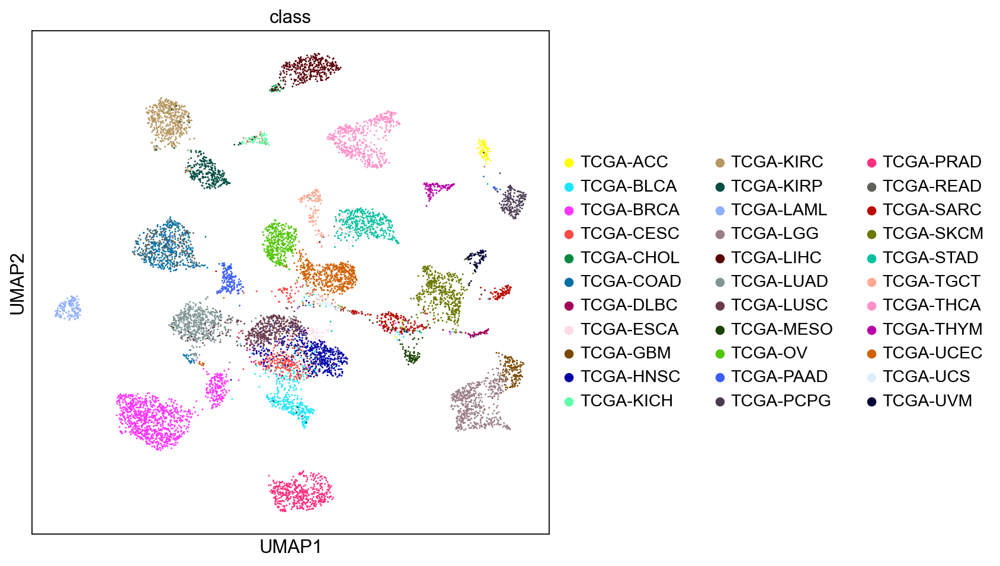

In [9]:
sc.pl.umap(sX,color='class',size=7)

In [10]:
sc.tl.leiden(sX,resolution=0.05)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


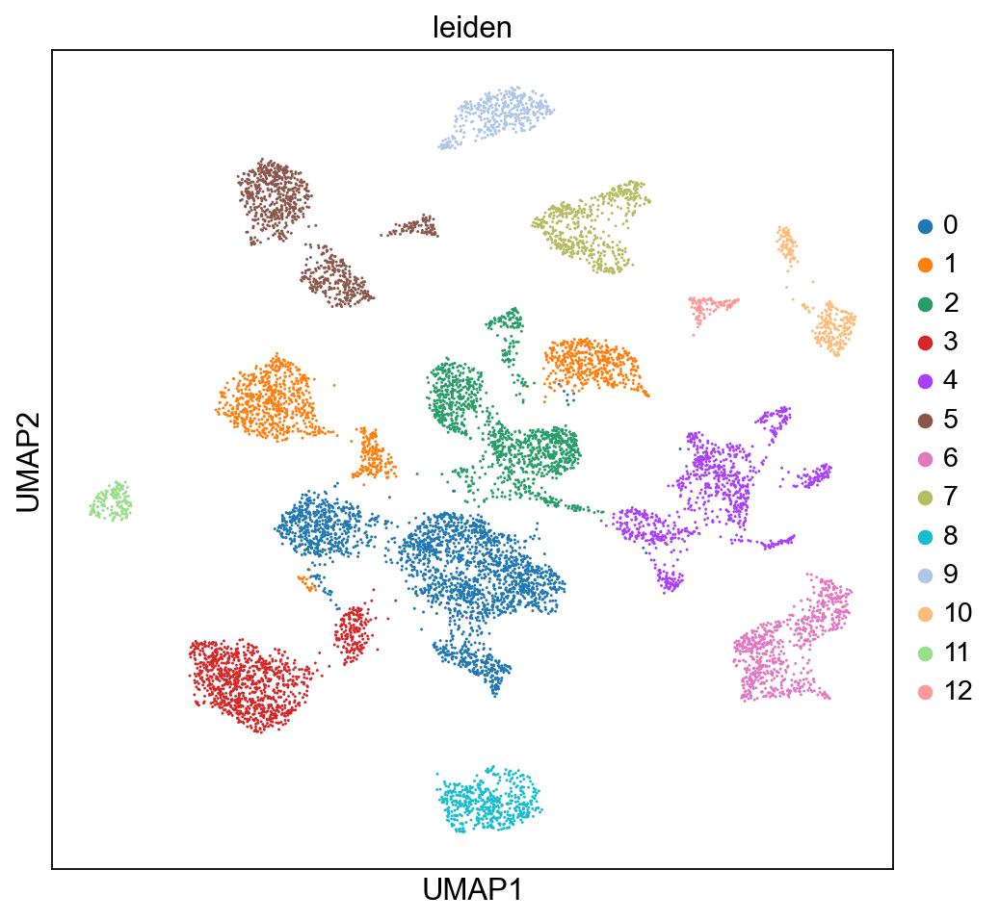

In [11]:
sc.pl.umap(sX,color='leiden',size=7)

### Rank Most Relevant Genes

Compute marker genes and plot a heatmap with expression levels of its top 10 marker genes across clusters.

In [12]:
sc.pp.neighbors(sX)
sX.uns['neighbors']

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [13]:
sX.uns['neighbors']

OverloadedDict, wrapping:
	{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'n_neighbors': 15, 'method': 'umap', 'random_state': 0, 'metric': 'euclidean'}}
With overloaded keys:
	['connectivities', 'distances'].

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:23)


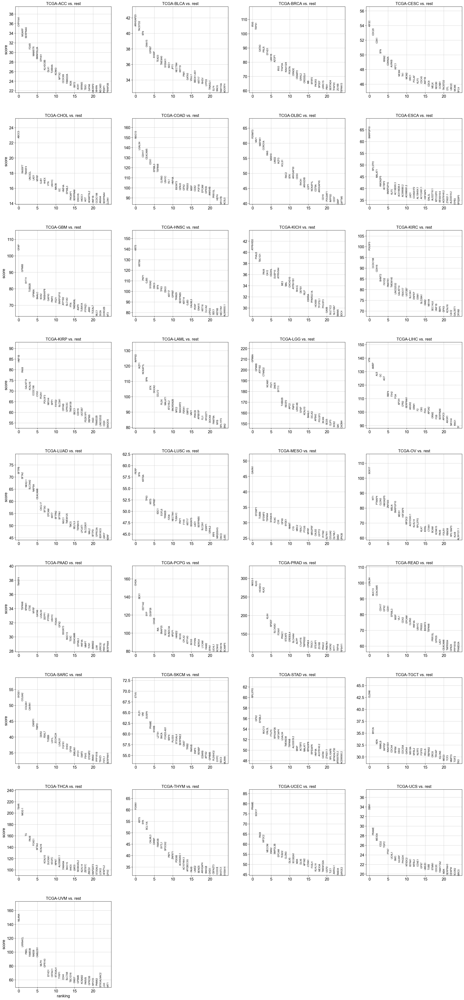

In [14]:
sc.tl.rank_genes_groups(sX, 'class', method='t-test')
sc.pl.rank_genes_groups(sX, n_genes=25,sharey=False,save=False)

### Top Upregulated Genes

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_class']`


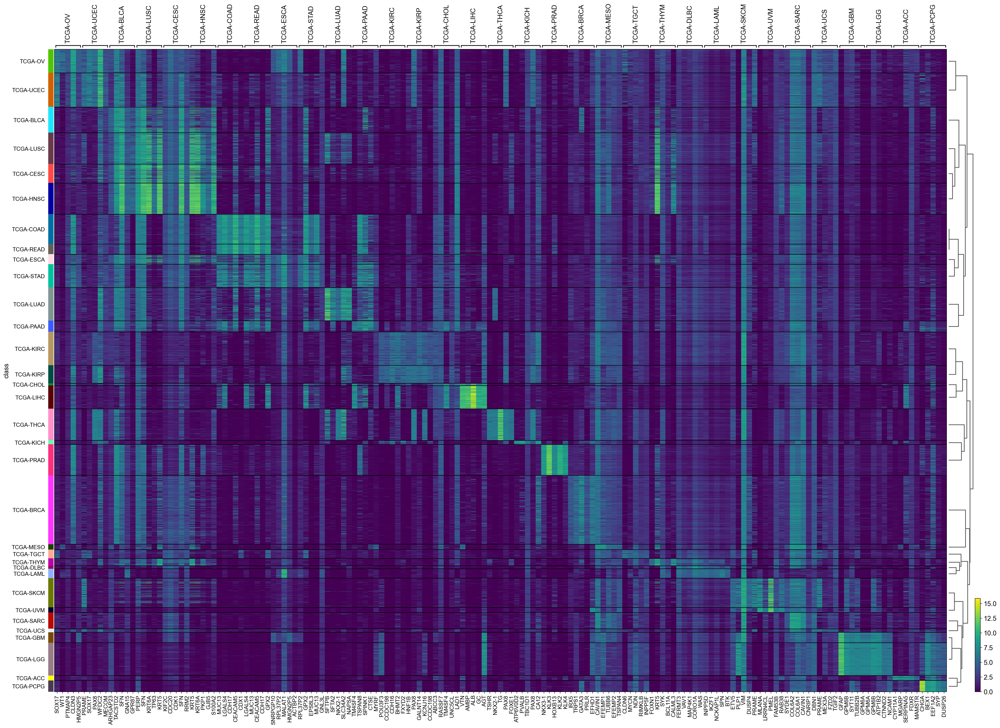

In [15]:
sc.pl.rank_genes_groups_heatmap(sX, n_genes=5, groupby="class",show_gene_labels=True,save=False,figsize=(35,25))

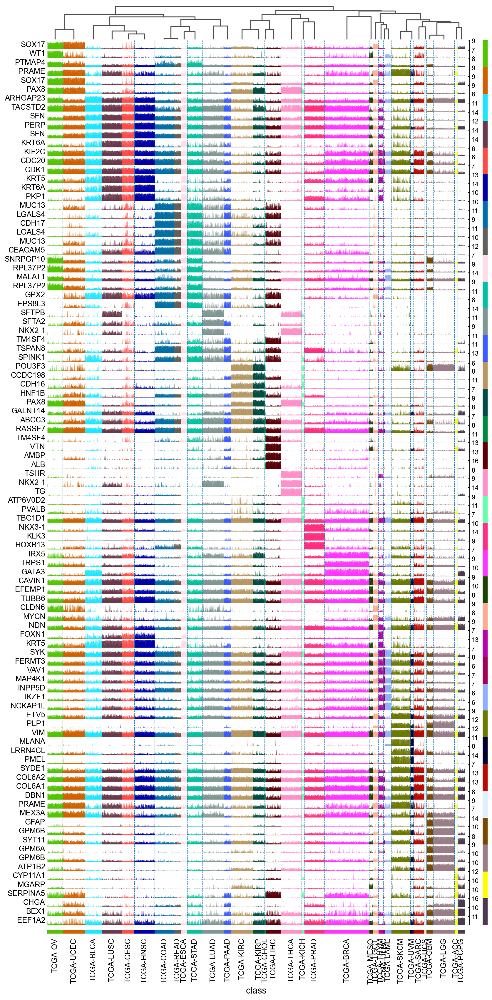

In [16]:
sc.pl.rank_genes_groups_tracksplot(sX, n_genes=3)

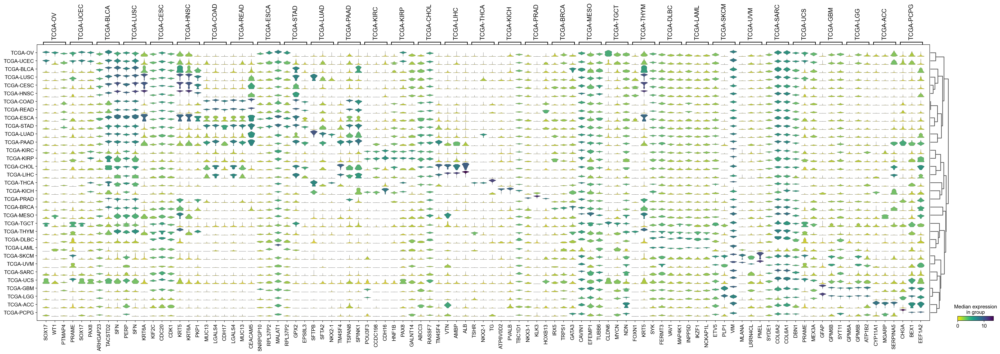

In [17]:
sc.pl.rank_genes_groups_stacked_violin(sX, n_genes=3, cmap='viridis_r')
